In [1]:
import os
gpu_num = 0 # Use "" to use the CPU
os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    colab_compat = True # deactivate preview
except:
    colab_compat = False
resolution = [480,320] # increase for higher quality of renderings

# Allows to exit cell execution in Jupyter
class ExitCell(Exception):
    def _render_traceback_(self):
        pass

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)
# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

tf.random.set_seed(1) # Set global random seed for reproducibility

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, PlanarArray, Camera

# For link-level simulations
from sionna.channel import cir_to_ofdm_channel, subcarrier_frequencies, OFDMChannel, ApplyOFDMChannel, CIRDataset
from sionna.nr import PUSCHConfig, PUSCHTransmitter, PUSCHReceiver
from sionna.utils import compute_ber, ebnodb2no, PlotBER
from sionna.ofdm import KBestDetector, LinearDetector
from sionna.mimo import StreamManagement

In [3]:
# Load integrated scene
scene = load_scene("blender/scene2.xml")

In [4]:
# Open 3D preview (only works in Jupyter notebook)
if colab_compat:
    scene.render(camera="scene-cam-0", num_samples=512);
    raise ExitCell
scene.preview()

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, position=(0.0, 0.0, …

In [5]:
# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="tr38901",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=1,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="cross")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[0.1,2.5,1])

# Add transmitter instance to scene
scene.add(tx)

# Create a receiver
rx = Receiver(name="rx",
              position=[5,2.5,1],
              orientation=[0.1,2.5,1])

# Add receiver instance to scene
scene.add(rx)

tx.look_at(rx) # Transmitter points towards receiver

In [6]:
scene.frequency = 60e9 # in Hz; implicitly updates RadioMaterials

scene.synthetic_array = True # If set to False, ray tracing will be done per antenna element (slower for large arrays)

In [7]:
# Compute propagation paths
paths = scene.compute_paths(max_depth=3,
                            num_samples=1e6)  # Number of rays shot into directions defined
                                              # by a Fibonacci sphere , too few rays can
                                              # lead to missing paths
# Visualize paths in the 3D preview
if colab_compat:
    scene.render("my_cam", paths=paths, show_devices=True, show_paths=True, resolution=resolution);
    raise ExitCell
#scene.preview(paths, show_devices=True, show_paths=True) # Use the mouse to focus on the visualized paths

In [8]:
paths.objects

<tf.Tensor: shape=(3, 1, 1, 20), dtype=int32, numpy=
array([[[[ -1, 146, 153, 146, 146, 153, 146, 108, 117, 143, 109, 143,
          145, 112, 153, 153, 153, 153, 146, 143]]],


       [[[ -1,  -1,  -1, 153, 109,  12, 143, 153, 146, 146,  -1,  -1,
          153, 143, 113,  13, 125, 109, 143, 146]]],


       [[[ -1,  -1,  -1,  -1,  -1,  -1,  -1,  -1,  -1,  -1,  -1,  -1,
           12, 102, 131,  12, 131, 153, 146, 143]]]])>

In [9]:
# Show the coordinates of the starting points of all rays.
# These coincide with the location of the transmitters.
print("Source coordinates: ", paths.sources.numpy())
print("Transmitter coordinates: ", list(scene.transmitters.values())[0].position.numpy())

# Show the coordinates of the endpoints of all rays.
# These coincide with the location of the receivers.
print("Target coordinates: ",paths.targets.numpy())
print("Receiver coordinates: ",list(scene.receivers.values())[0].position.numpy())

# Show the types of all paths:
# 0 - LoS, 1 - Reflected, 2 - Diffracted, 3 - Scattered
# Note that Diffraction and scattering are turned off by default.
print("Path types: ", paths.types.numpy())

Source coordinates:  [[0.1 2.5 1. ]]
Transmitter coordinates:  [0.1 2.5 1. ]
Target coordinates:  [[5.  2.5 1. ]]
Receiver coordinates:  [5.  2.5 1. ]
Path types:  [[0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]]


In [10]:
# We can now access for every path the channel coefficient, the propagation delay,
# as well as the angles of departure and arrival, respectively (zenith and azimuth).

# Let us inspect a specific path in detail 
path_idx = 5# Try out other values in the range [0, 13]

# For a detailed overview of the dimensions of all properties, have a look at the API documentation
print(f"\n--- Detailed results for path {path_idx} ---")
print(f"Channel coefficient: {paths.a[0,0,0,0,0,path_idx, 0].numpy()}")
print(f"Propagation delay: {paths.tau[0,0,0,path_idx].numpy()*1e6:.5f} us")
print(f"Zenith angle of departure: {paths.theta_t[0,0,0,path_idx]:.4f} rad")
print(f"Azimuth angle of departure: {paths.phi_t[0,0,0,path_idx]:.4f} rad")
print(f"Zenith angle of arrival: {paths.theta_r[0,0,0,path_idx]:.4f} rad")
print(f"Azimuth angle of arrival: {paths.phi_r[0,0,0,path_idx]:.4f} rad")


--- Detailed results for path 5 ---
Channel coefficient: (-4.961496415489819e-06+3.145295295325923e-07j)
Propagation delay: 0.01907 us
Zenith angle of departure: 1.5708 rad
Azimuth angle of departure: 1.0911 rad
Zenith angle of arrival: 1.5708 rad
Azimuth angle of arrival: -2.0504 rad


In [11]:
# Default parameters in the PUSCHConfig
#subcarrier_spacing = 15e3
#subcarrier_spacing = 30e3
#subcarrier_spacing = 60e3
subcarrier_spacing = 120e3
#subcarrier_spacing = 240e3
fft_size = 48

In [12]:
# Print shape of channel coefficients before the application of Doppler shifts
# The last dimension corresponds to the number of time steps which defaults to one
# as there is no mobility
print("Shape of `a` before applying Doppler shifts: ", paths.a.shape)

# Apply Doppler shifts
paths.apply_doppler(sampling_frequency=subcarrier_spacing, # Set to 15e3 Hz
                    num_time_steps=14, # Number of OFDM symbols
                    tx_velocities=[3.,0,0], # We can set additional tx speeds
                    rx_velocities=[0,7.,0]) # Or rx speeds

print("Shape of `a` after applying Doppler shifts: ", paths.a.shape)

a, tau = paths.cir()
print("Shape of tau: ", tau.shape)

Shape of `a` before applying Doppler shifts:  (1, 1, 2, 1, 1, 20, 1)
Shape of `a` after applying Doppler shifts:  (1, 1, 2, 1, 1, 20, 14)
Shape of tau:  (1, 1, 1, 20)


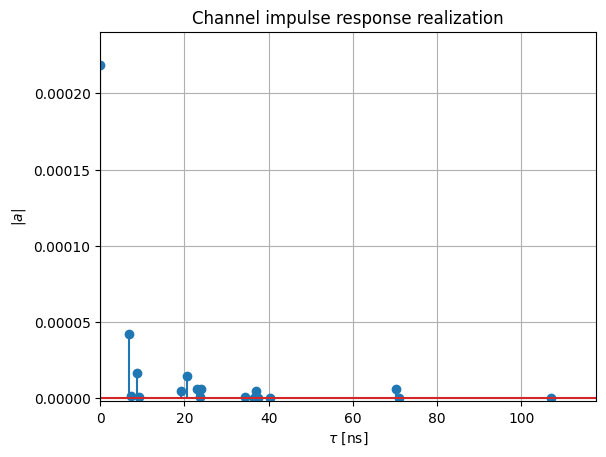

In [13]:
t = tau[0,0,0,:]/1e-9 # Scale to ns
a_abs = np.abs(a)[0,0,0,0,0,:,0]
a_max = np.max(a_abs)
# Add dummy entry at start/end for nicer figure
t = np.concatenate([(0.,), t, (np.max(t)*1.1,)])
a_abs = np.concatenate([(np.nan,), a_abs, (np.nan,)])

# And plot the CIR
plt.figure()
plt.title("Channel impulse response realization")

plt.stem(t, a_abs)
plt.xlim([0, np.max(t)])
plt.ylim([-2e-6, a_max*1.1])
plt.xlabel(r"$\tau$ [ns]")
plt.ylabel(r"$|a|$");
plt.grid()

In [14]:
# Disable normalization of delays
paths.normalize_delays = False

# Get only the LoS path
_, tau = paths.cir(los=True, reflection=False)
print("Delay of first path without normalization: ", np.squeeze(tau))

paths.normalize_delays = True
_, tau = paths.cir(los=True, reflection=False)
print("Delay of first path with normalization: ", np.squeeze(tau))

Delay of first path without normalization:  1.6344641e-08
Delay of first path with normalization:  0.0


In [15]:
# Compute frequencies of subcarriers and center around carrier frequency
frequencies = subcarrier_frequencies(fft_size, subcarrier_spacing)

# Compute the frequency response of the channel at frequencies.
h_freq = cir_to_ofdm_channel(frequencies,
                             a,
                             tau,
                             normalize=True) # Non-normalized includes path-loss

# Verify that the channel power is normalized
h_avg_power = tf.reduce_mean(tf.abs(h_freq)**2).numpy()

print("Shape of h_freq: ", h_freq.shape)
print("Average power h_freq: ", h_avg_power) # Channel is normalized

Shape of h_freq:  (1, 1, 2, 1, 1, 14, 48)
Average power h_freq:  0.9999998


In [16]:
# Placeholder for tx signal of shape
# [batch size, num_tx, num_tx_ant, num_ofdm_symbols, fft_size]
x = tf.zeros([h_freq.shape.as_list()[i] for i in [0,3,4,5,6]], tf.complex64)

no = 0.1 # noise variance

# Init channel layer
channel = ApplyOFDMChannel(add_awgn=True)

# Apply channel
y = channel([x, h_freq, no])

# [batch size, num_rx, num_rx_ant, num_ofdm_symbols, fft_size]
print(y.shape)

(1, 1, 2, 14, 48)


In [17]:
# Init pusch_transmitter
pusch_config = PUSCHConfig()

# Instantiate a PUSCHTransmitter from the PUSCHConfig
pusch_transmitter = PUSCHTransmitter(pusch_config)

# Create a PUSCHReceiver using the PUSCHTransmitter
pusch_receiver = PUSCHReceiver(pusch_transmitter)

In [18]:
# Simulate transmissions over the
batch_size = 100 # h_freq is broadcast, i.e., same CIR for all samples but different AWGN realizations
ebno_db = 2. # SNR in dB

no = ebnodb2no(ebno_db,
               pusch_transmitter._num_bits_per_symbol,
               pusch_transmitter._target_coderate,
               pusch_transmitter.resource_grid)

x, b = pusch_transmitter(batch_size) # Generate transmit signal and info bits

y = channel([x, h_freq, no]) # Simulate channel output

b_hat = pusch_receiver([y, no]) # Recover the info bits

# Compute BER
print(f"BER: {compute_ber(b, b_hat).numpy():.5f}")

BER: 0.10633


In [19]:
#cm = scene.coverage_map(max_depth=5,
                        #diffraction=True, # Disable to see the effects of diffraction
                        #cm_cell_size=(0.05, 0.05), # Grid size of coverage map cells in m
                        #combining_vec=None,
                        #precoding_vec=None,
                        #num_samples=int(20e6)) # Reduce if your hardware does not have enough memory

In [20]:
#scene.preview()
scene.preview(paths, show_devices=True, show_paths=True, fov=90, clip_at=2.99) # Use the mouse to focus on the visualized paths
#scene.preview(coverage_map=cm)

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, position=(0.0, 0.0, …

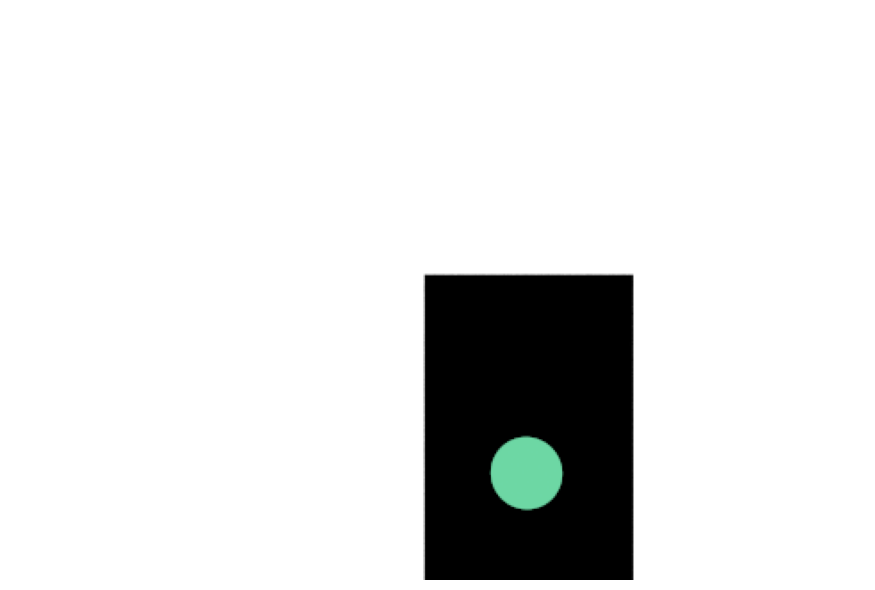

In [21]:
# Create new camera with different configuration
my_cam = Camera("my_cam", position=[10,5,30], look_at=[10,5,0])
scene.add(my_cam)

# Render scene with new camera*
scene.render("my_cam", resolution=resolution, num_samples=512); # Increase num_samples to increase image quality

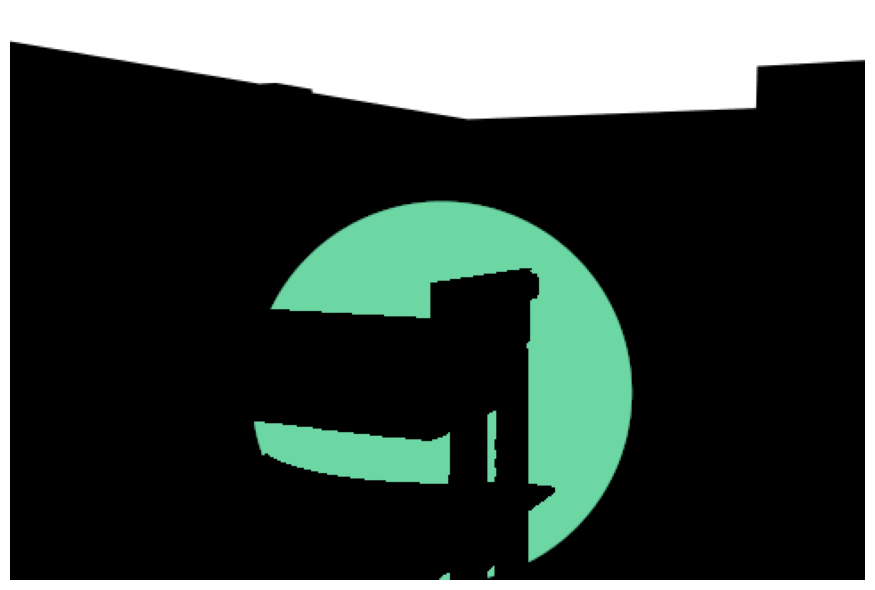

In [22]:
# Create new camera with different configuration
my_cam1 = Camera("my_cam1", position=[0.1,0.1,2], look_at=[10,5,1])
scene.add(my_cam1)

# Render scene with new camera*
scene.render("my_cam1", resolution=resolution, num_samples=512); # Increase num_samples to increase image quality